# i. Perkenalan

Nama : Fadhola Asandi Mardika Putra

Objective:
Membuat model Computer Vision akan digunakan untuk mengenali jenis kulit wajah (oily, dry, normal) untuk membantu pengguna memilih produk skincare yang sesuai.

Justifikasi:
Banyak orang salah memilih produk karena tidak tahu jenis kulitnya. Ini bisa memperparah kondisi kulit seperti iritasi atau jerawat.

https://www.healthshots.com/beauty/skin-care/dehydrated-oily-skin-symptoms-and-treatment/
https://canoe.com/life/fashion/common-skincare-issues-how-to-treat

Pengguna Aplikasi:
Pemula di dunia skincare


# ii. Import Libraries

In [ ]:
# Downgrade version of TensorFlow and tf-keras

!pip install -q --upgrade "tensorflow<2.16" "tf-keras<2.16"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 75.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 76.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 90.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 115.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 28.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 122.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 37.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 7.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-text 2.18.1 requires tens

In [ ]:
# Import libraries

import os
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, BatchNormalization, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import HeNormal

from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings('ignore')

# Check TensorFlow version
print(tf.__version__)

2.15.1


# iii. Data Loading

In [ ]:
!pip install kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
%%time
# Download Dataset
# Source dataset : https://www.kaggle.com/datasets/shakyadissanayake/oily-dry-and-normal-skin-types-dataset

!kaggle datasets download -d shakyadissanayake/oily-dry-and-normal-skin-types-dataset

Dataset URL: https://www.kaggle.com/datasets/shakyadissanayake/oily-dry-and-normal-skin-types-dataset
License(s): apache-2.0
 72% 90.0M/124M [00:00<00:00, 937MB/s]
100% 124M/124M [00:00<00:00, 903MB/s] 
CPU times: user 21.8 ms, sys: 2.57 ms, total: 24.4 ms
Wall time: 3.22 s


In [ ]:
# Every dataset that downloaded from Kaggle is in format `.zip`. So, we must unzip it before we can using the dataset.
!unzip -qq ./oily-dry-and-normal-skin-types-dataset.zip

In [ ]:
# Define path

main_path = '/content/Oily-Dry-Skin-Types/'
train_path = os.path.join(main_path, 'train')
val_path = os.path.join(main_path, 'valid')
test_path = os.path.join(main_path, 'test')

In [ ]:
# Check how many data in `train_path`, `val_path` and `test_path`

def check_path(path):
  labels = os.listdir(path)
  for label in labels:
    num_data = len(os.listdir(os.path.join(path, label)))
    print(f'Total Data - {label} : {num_data}')

print('Train Path')
check_path(train_path)
print('')

print('Val Path')
check_path(val_path)
print('')

print('Test Path')
check_path(test_path)
print('')

Train Path
Total Data - oily : 1000
Total Data - normal : 1104
Total Data - dry : 652

Val Path
Total Data - oily : 80
Total Data - normal : 111
Total Data - dry : 71

Test Path
Total Data - oily : 40
Total Data - normal : 59
Total Data - dry : 35



In [ ]:
def plot_images(path):
    labels = os.listdir(path)
    for label in labels:
        folder_path = os.path.join(path, label)
        fig = plt.figure(figsize=(20, 5))
        columns = 5
        rows = 1
        print('Class :', label)
        images = os.listdir(folder_path)

        for index in range(columns):
            img_path = os.path.join(folder_path, images[index])
            image = plt.imread(img_path)

            # print(f"Image {index+1} shape:", image.shape)

            fig.add_subplot(rows, columns, index + 1)
            plt.imshow(image)
            plt.title(f"Shape: {image.shape}")
            plt.axis("off")
        plt.show()


Class : oily


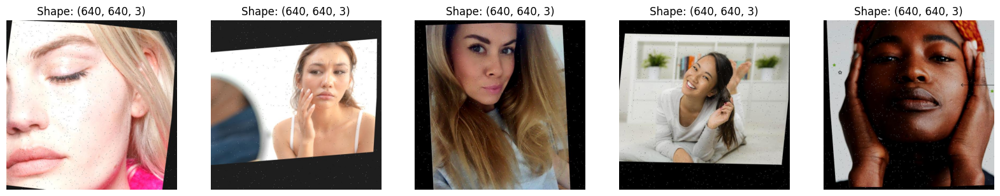

Class : normal


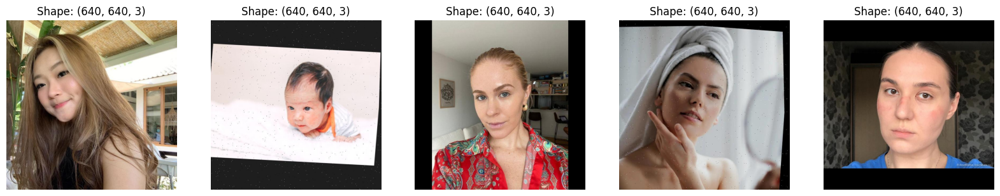

Class : dry


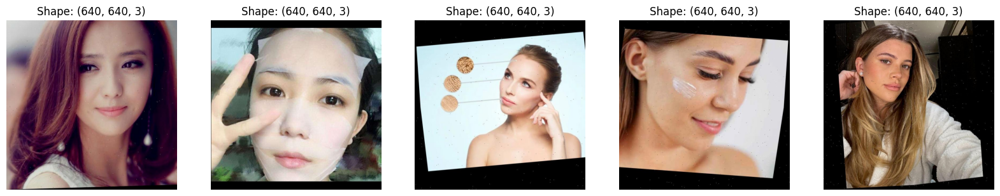

In [ ]:
# Visualization of train_path

plot_images(train_path)

Class : oily


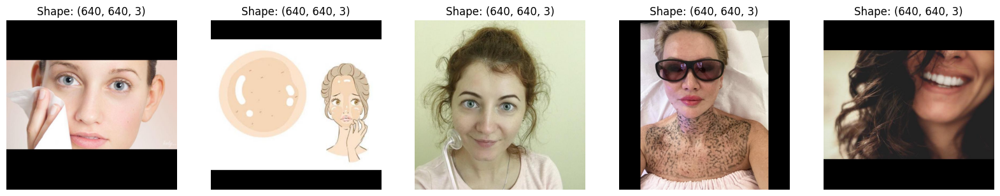

Class : normal


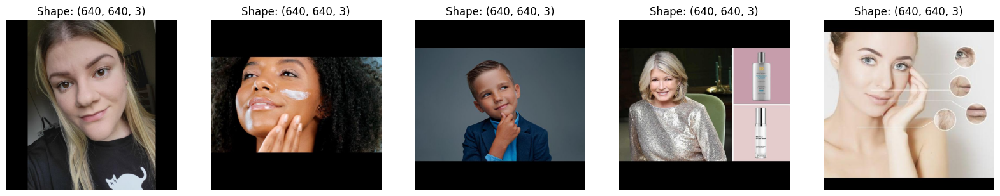

Class : dry


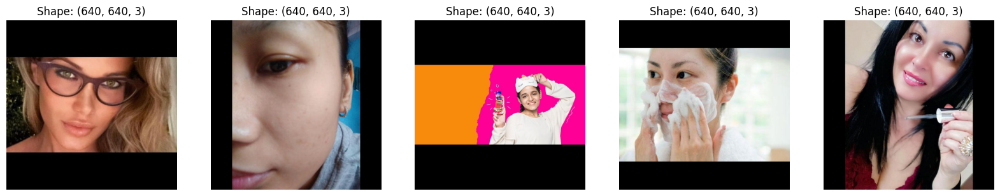

In [ ]:
# Visualization of val_path

plot_images(val_path)

Class : oily


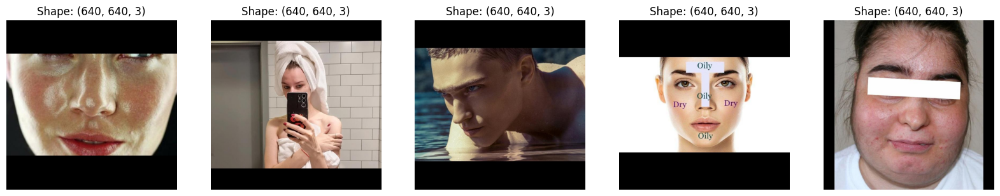

Class : normal


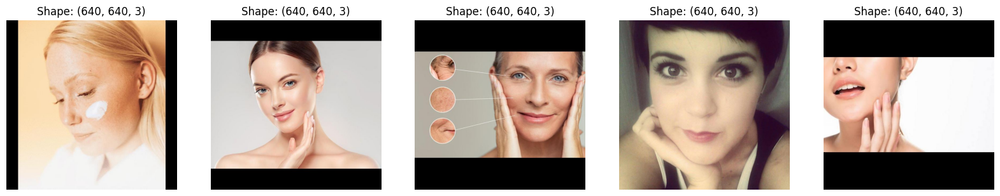

Class : dry


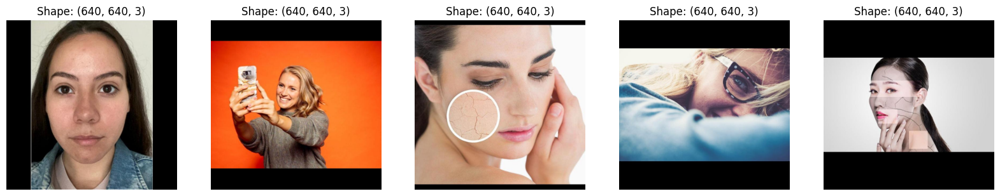

In [ ]:
# Visualization of `test_path`

plot_images(test_path)

# iv. Exploratory Data Analysis (EDA)

## iv. General Visualisation


In [ ]:
def plot_class_images(path, class_name, random_state):
    folder_path = os.path.join(path, class_name)
    fig = plt.figure(figsize=(16, 10))
    columns = 5
    rows = 3
    print('Class:', class_name)

    images = os.listdir(folder_path)
    random.seed(random_state)
    sampled_images = random.sample(images, min(columns * rows, len(images)))

    for index, img_name in enumerate(sampled_images):
        img_path = os.path.join(folder_path, img_name)
        image = plt.imread(img_path)

        fig.add_subplot(rows, columns, index + 1)
        plt.imshow(image)
        plt.title(f"{image.shape}")
        plt.axis("off")
    plt.show()


Class: oily


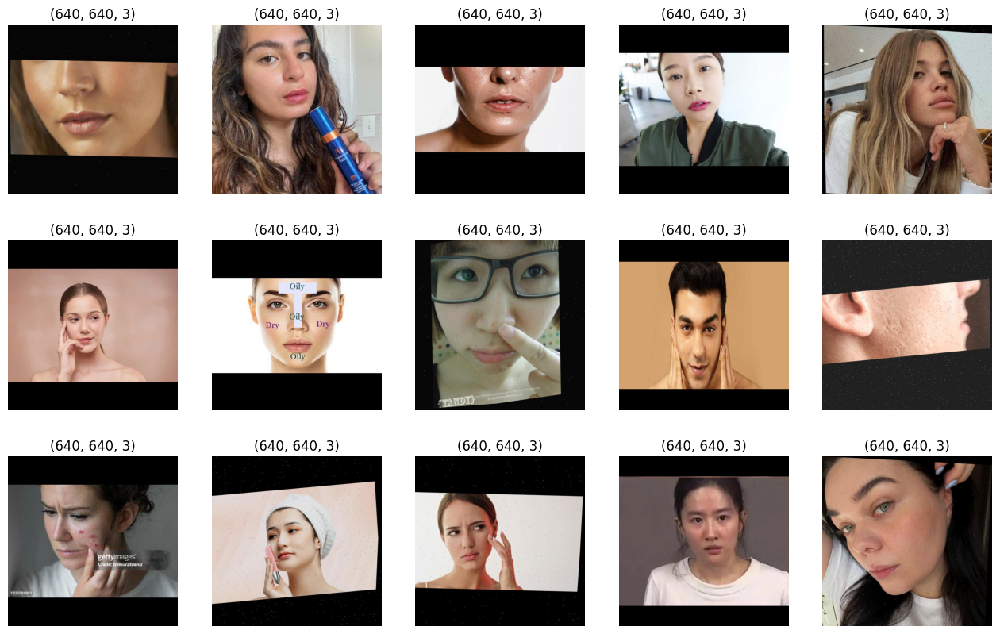

Class: dry


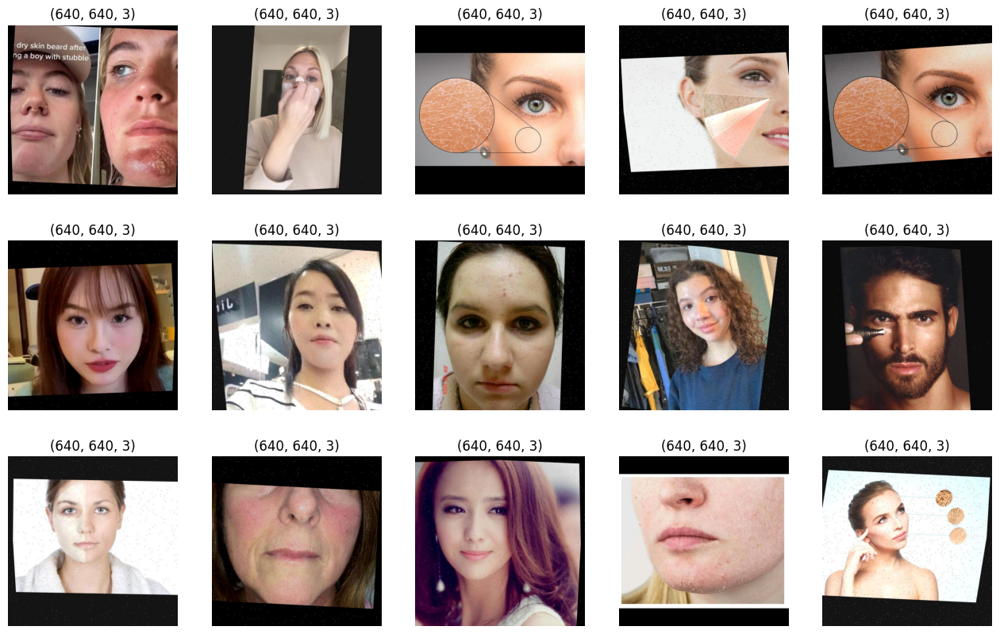

Class: normal


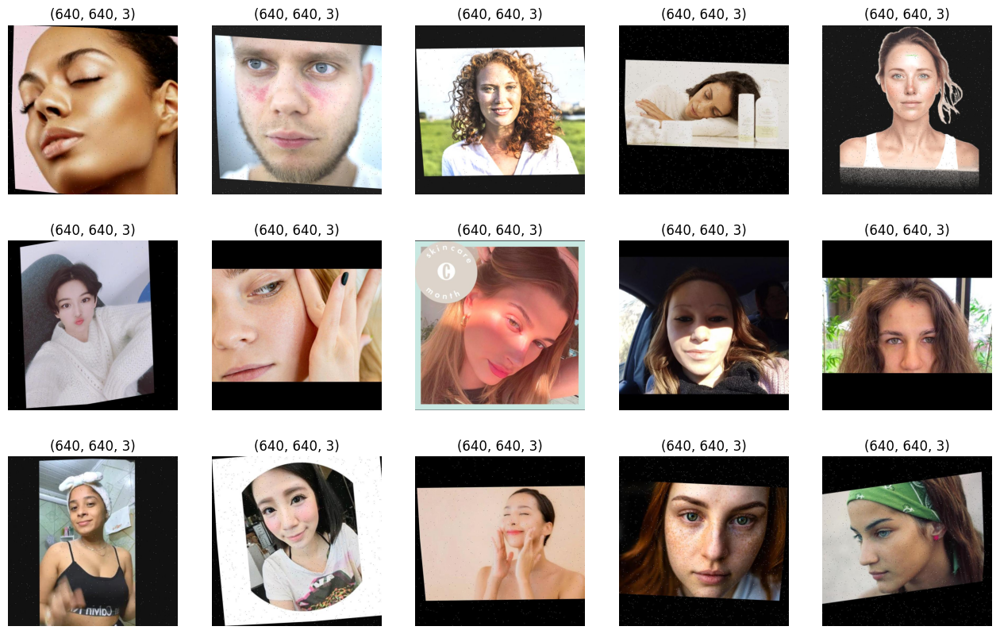

In [ ]:
for cls in ['oily', 'dry', 'normal']:
    plot_class_images(train_path, cls, random_state=61)


Di general visualisasi terlihat bahwa beberapa gambar tampaknya **tidak konsisten** dengan label yang diberikan.

Yaitu:
  - Pada kelas **oily**, terdapat gambar wajah dengan tekstur kulit kering atau normal.
  - Di kelas **normal**, muncul gambar yang tampak jelas berminyak atau terlalu kering.
  - Bahkan ada gambar **iklan skincare** yang tidak menunjukkan kulit asli, sehingga sulit diidentifikasi.

Langkah kedepannya bersihkan datanya dulu, pisahkan gambar dengan benar dan hapus yang tidak menunjukkan kulit.

## iv.1 Color and Shape

 Terlihat Pada kelas **oily**, kulit cenderung lebih mengilap atau reflektif. Kelas **dry** tampak merah dan tidak mengilap, juga memiliki tekstur kasar, sedangkan kelas **normal** terlihat sedikit mengilap.
 tapi banyak gambar yang tidak menunjukkan wajah secara penuh, ada yang hanya sebagian wajah, bahkan ada yang memperlihatkan hingga bahu atau bagian tubuh lainnya dll.

## iv.2 Size

In [ ]:
def describe_image_shape(image_path):
    img = Image.open(image_path)
    img_array = np.array(img)
    shape = img_array.shape

    # Deteksi channel berdasarkan panjang shape
    if len(shape) == 2:
        mode = "Grayscale"
    elif shape[2] == 3:
        mode = "RGB"
    elif shape[2] == 4:
        mode = "RGBA"
    else:
        mode = f"{shape[2]}-channel (unknown)"

    print(f"Shape: {shape} → {mode}")


In [ ]:
image_path = os.path.join(train_path, 'oily', os.listdir(os.path.join(train_path, 'oily'))[0])
describe_image_shape(image_path)


Shape: (640, 640, 3) → RGB


In [ ]:
image_path = os.path.join(train_path, 'dry', os.listdir(os.path.join(train_path, 'dry'))[0])
describe_image_shape(image_path)


Shape: (640, 640, 3) → RGB


In [ ]:
image_path = os.path.join(train_path, 'normal', os.listdir(os.path.join(train_path, 'normal'))[0])
describe_image_shape(image_path)


Shape: (640, 640, 3) → RGB


## iv.3 Room Color

In [ ]:
def plot_class_images_pseudocolor(path, class_name, random_state=42):
    folder_path = os.path.join(path, class_name)
    fig = plt.figure(figsize=(16, 10))
    columns = 5
    rows = 3
    print('Pseudocolor Luminance - Class:', class_name)

    images = os.listdir(folder_path)
    random.seed(random_state)
    sampled_images = random.sample(images, min(columns * rows, len(images)))

    for idx, img_name in enumerate(sampled_images):
        img_path = os.path.join(folder_path, img_name)
        img = Image.open(img_path).convert('L')
        img_np = np.array(img)

        ax = fig.add_subplot(rows, columns, idx + 1)
        imgplot = plt.imshow(img_np)
        imgplot.set_cmap('nipy_spectral')
        plt.axis("off")

    plt.tight_layout()
    plt.show()

Pseudocolor Luminance - Class: oily


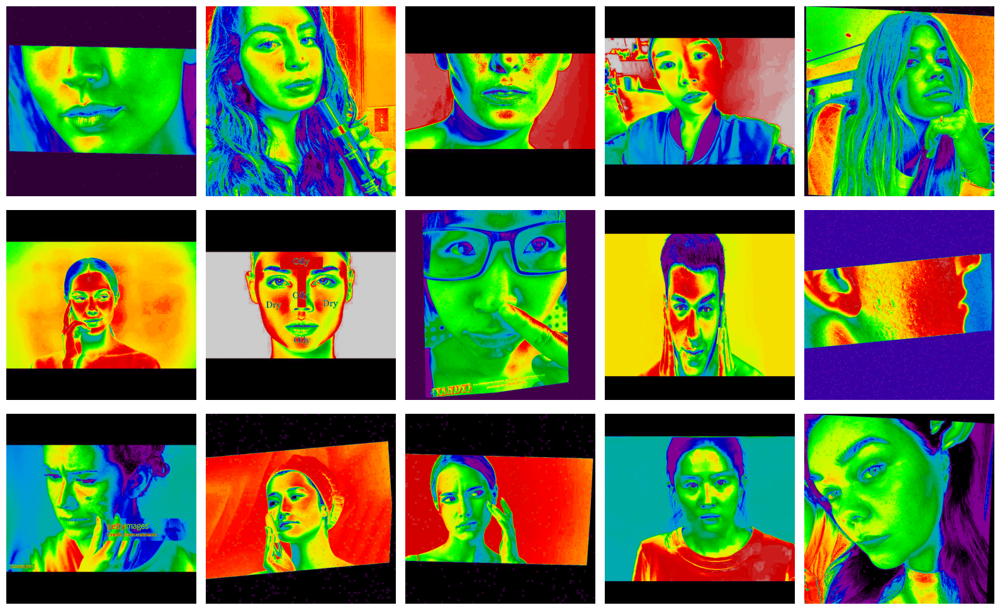

Pseudocolor Luminance - Class: dry


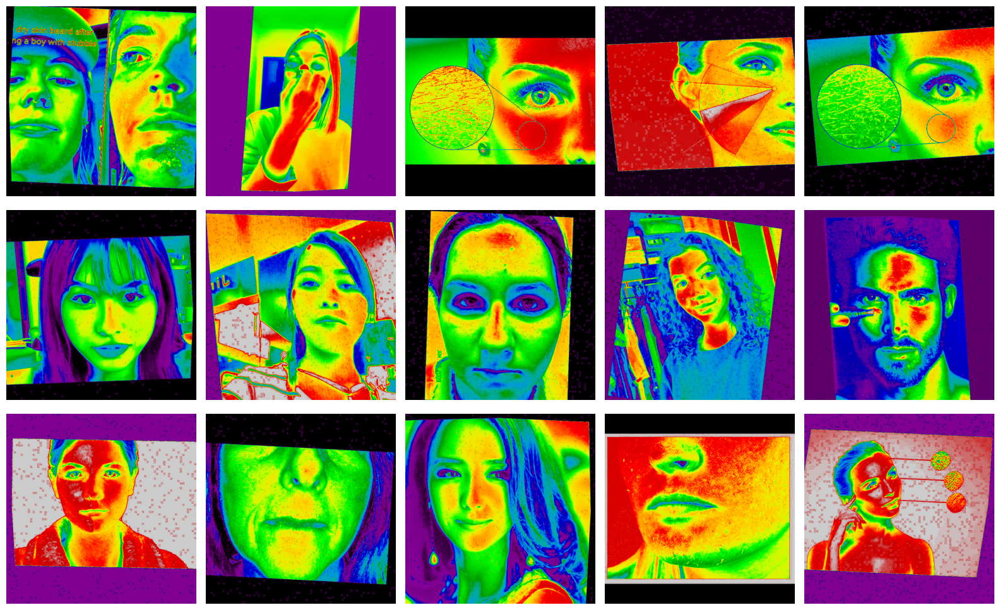

Pseudocolor Luminance - Class: normal


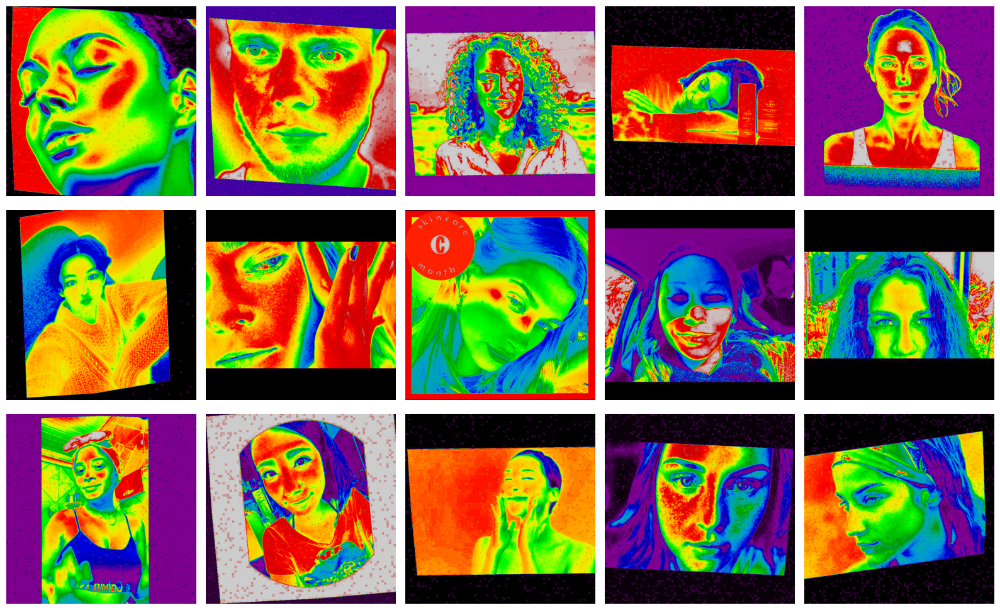

In [ ]:
for cls in ['oily', 'dry', 'normal']:
    plot_class_images_pseudocolor(train_path, cls, random_state=61)


## iv. Angle

Banyak gambar tidak memiliki sudut pengambilan yang seragam. Ada yang diambil dari depan, samping, atas, bahkan dari kejauhan.
Beberapa hanya memperlihatkan sebagian wajah atau tubuh, yang berpotensi menjadi gangguan bagi model dalam memahami fitur kulit secara konsisten.

## iv. Another Character

Karakteristik lain yang menonjol di antaranya:
  - **Tangan atau benda** menutupi sebagian wajah.
  - Banyak gambar memiliki **noise visual**, seperti watermark, logo brand, atau teks iklan.
  - **Latar belakang** gambar sangat beragam, dari yang polos hingga sangat ramai, yang bisa menjadi distraktor saat training model.

# v. Feature Engineering

## Preprocessing

Menggunakan augmentasi campuran seperti rotasi, zoom, shift dan flip karena walaupun data sudah beragam tapi untuk membuat model lebih melihat data dari banyak sudut pandang, dan yang paling penting pada brightness_range karena cahaya sangat berpengaruh pada kulit.

In [ ]:
img_height = 224
img_width = 224
batch_size = 64

In [ ]:
# Create batch generator for train-set, val-set, and test-set

train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.,
                                                                    rotation_range=20,
                                                                    zoom_range=0.05,
                                                                    width_shift_range=0.05,
                                                                    height_shift_range=0.05,
                                                                    brightness_range=[0.5, 1.2],
                                                                    horizontal_flip=True)

train_set = train_datagen.flow_from_directory(train_path,
                                                      target_size=(img_height,img_width),
                                                      class_mode='sparse',
                                                      batch_size=batch_size,
                                                      shuffle=True,
                                                      seed=2)

val_set = train_datagen.flow_from_directory(val_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    batch_size=batch_size,
                                                    shuffle=True,
                                                    seed=2)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255.)

test_set = test_datagen.flow_from_directory(test_path,
                                                    target_size=(img_height,img_width),
                                                    class_mode='sparse',
                                                    batch_size=batch_size,
                                                    shuffle=False,
                                                    seed=2)

Found 2756 images belonging to 3 classes.
Found 262 images belonging to 3 classes.
Found 134 images belonging to 3 classes.


In [ ]:
train_set.class_indices

{'dry': 0, 'normal': 1, 'oily': 2}

# vi. ANN Training using Sequential API

## vi.1. Model Definition

Mencoba menggunakan rangkaian Convolution → Pooling → Flatten → beberapa Dense dengan Dropout, tanpa banyak mekanisme untuk menstabilkan atau menormalkan aliran gradien dan masih pakai initializer default, dan melihat bagaimana hasilnya.

In [ ]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
# Create Sequential API model

model = Sequential()
model.add(Conv2D(32, (3,3), activation='relu', input_shape=(img_height, img_width,3)))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(64, (3,3), activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Conv2D(128, (3,3),activation='relu'))
model.add(MaxPooling2D(2, 2))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(32, activation='relu'))
model.add(Dense(16, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(3, activation='softmax'))

# Compile
model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 128)       0

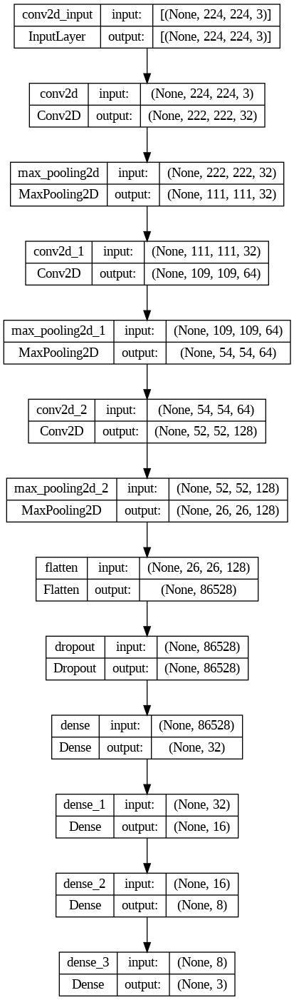

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model, show_shapes=True)

## vi.2. Model Training

In [ ]:
# Train the model

%%time
history = model.fit(train_set, epochs=20, validation_data=val_set, batch_size=batch_size)

Epoch 1/20
44/44 [==============================] - 243s 5s/step - loss: 1.0944 - accuracy: 0.3585 - val_loss: 1.0989 - val_accuracy: 0.3053
Epoch 2/20
44/44 [==============================] - 241s 5s/step - loss: 1.0846 - accuracy: 0.3628 - val_loss: 1.0940 - val_accuracy: 0.3053
Epoch 3/20
44/44 [==============================] - 241s 5s/step - loss: 1.0818 - accuracy: 0.3755 - val_loss: 1.0898 - val_accuracy: 0.3817
Epoch 4/20
44/44 [==============================] - 237s 5s/step - loss: 1.0792 - accuracy: 0.3908 - val_loss: 1.0950 - val_accuracy: 0.3282
Epoch 5/20
44/44 [==============================] - 239s 5s/step - loss: 1.0713 - accuracy: 0.3944 - val_loss: 1.0924 - val_accuracy: 0.3664
Epoch 6/20
44/44 [==============================] - 235s 5s/step - loss: 1.0695 - accuracy: 0.4104 - val_loss: 1.0931 - val_accuracy: 0.3511
Epoch 7/20
44/44 [==============================] - 234s 5s/step - loss: 1.0695 - accuracy: 0.4053 - val_loss: 1.1063 - val_accuracy: 0.3206
Epoch 8/20
44

## vi.3. Model Evaluation

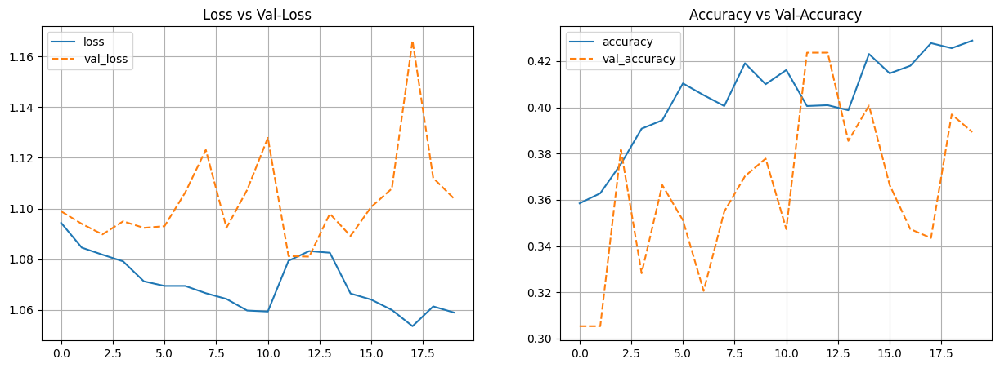

In [ ]:
# Plot training results

history_tl_df = pd.DataFrame(history.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_tl_df[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_tl_df[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [ ]:
# Check the performance of test-set

## Get the probability
y_pred_prob = model.predict_generator(test_set)

## Get class with maximum probability
y_pred_class = np.argmax(y_pred_prob, axis=-1)

## Display Classification Report
print(classification_report(test_set.classes, y_pred_class, target_names=np.array(list(train_set.class_indices.keys()))))

              precision    recall  f1-score   support

         dry       1.00      0.03      0.06        35
      normal       0.45      0.81      0.58        59
        oily       0.41      0.28      0.33        40

    accuracy                           0.45       134
   macro avg       0.62      0.37      0.32       134
weighted avg       0.58      0.45      0.37       134



Training loss menurun cukup perlahan, validation loss naik turun (model overfitting)

Validation accuracy stagnan di sekitar 35–40 %

recall dan f1-score kelas dry sangat rendah, tapi precision sangat tinggi, yang berarti bias

# vii. ANN Improvement using Sequential API

## vii.1. Model Definition

Untuk mengatasi masalah sebelumnya,

Mengganti kernel_initializer ke HeNormal yang sesuai dengan ReLU

Menambah batch Normalization setelah setiap Conv2D dan beberapa Dense untuk menormalkan output tiap layer, sehingga jaringan bisa belajar lebih cepat dan stabil dan mengurangi sensitifitas terhadap nilai awal bobot dan learning rate

Menggunakan 2 dropout (0.5 dan 0.3) untuk menjaga agar model tidak terlalu menghafal pola training, sehingga val_accuracy bisa tetap naik meski training_accuracy tinggi.

Learning rate lebih kecil 1e-4 awal, supaya fine-tuning weight dengan langkah-langkah kecil dan menghindari lompatan terlalu besar

Menambahkan beberapa callbacks:

- EarlyStopping untuk menghentikan training saat val_accuracy tidak membaik lagi, mencegah overfitting lebih jauh.

- ReduceLROnPlateau menurunkan learning rate otomatis bila val_loss tidak lagi menurun secara signifikan, membantu model tidak hanya berhenti di sembarang titik rendah (loss lebih rendah), tetapi bergerak ke titik yang lebih baik(val_loss rendah, val_accuracy tinggi)

- ModelCheckpoint menyimpan bobot terbaik berdasarkan val_loss.

In [ ]:
# Clear session

seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)


In [ ]:
# Create Sequential API model

initializer = tf.keras.initializers.HeNormal(seed=seed)

model_2 = Sequential()
model_2.add(Conv2D(32, (3,3), kernel_initializer=initializer, input_shape=(img_height, img_width,3)))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(2, 2))

model_2.add(Conv2D(64, (3,3), kernel_initializer=initializer))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(2, 2))

model_2.add(Conv2D(128, (3,3), kernel_initializer=initializer))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(MaxPooling2D(2, 2))

model_2.add(Flatten())
model_2.add(Dropout(0.5, seed=seed))
model_2.add(Dense(32, kernel_initializer=initializer))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(Dense(16, kernel_initializer=initializer))
model_2.add(Dropout(0.3, seed=seed))
model_2.add(BatchNormalization())
model_2.add(Activation('relu'))
model_2.add(Dense(8, kernel_initializer=initializer))
model_2.add(Dense(3, activation='softmax', kernel_initializer=tf.keras.initializers.GlorotNormal(seed)))

# Compile
model_2.compile(loss='sparse_categorical_crossentropy',
              optimizer=Adam(learning_rate=1e-4),
              metrics=['accuracy'])
model_2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 222, 222, 32)      128       
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 222, 222, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 batch_normalization_1 (Bat  (None, 109, 109, 64)      2

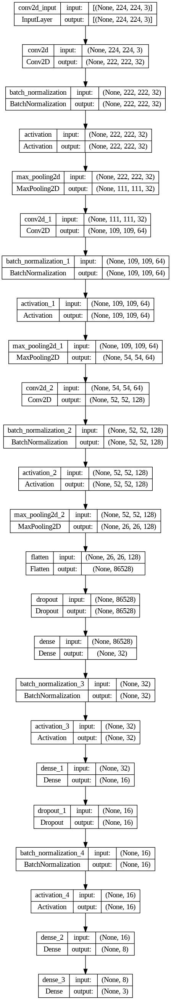

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model_2, show_shapes=True)

## vii.2. Model Training

In [ ]:
# Train the model

%%time

early_stop = EarlyStopping(patience=5, monitor='val_accuracy', restore_best_weights=True, verbose=1)
checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)

history_2 = model_2.fit(
    train_set, epochs=20,
    validation_data=val_set,
    batch_size=batch_size,
    callbacks=[early_stop, checkpoint, reduce_lr])

Epoch 1/20
44/44 [==============================] - ETA: 0s - loss: 1.1983 - accuracy: 0.3501
Epoch 1: val_loss improved from inf to 1.11891, saving model to best_model.keras
44/44 [==============================] - 327s 7s/step - loss: 1.1983 - accuracy: 0.3501 - val_loss: 1.1189 - val_accuracy: 0.3435 - lr: 1.0000e-04
Epoch 2/20
44/44 [==============================] - ETA: 0s - loss: 1.1650 - accuracy: 0.3647
Epoch 2: val_loss did not improve from 1.11891
44/44 [==============================] - 323s 7s/step - loss: 1.1650 - accuracy: 0.3647 - val_loss: 1.1323 - val_accuracy: 0.3473 - lr: 1.0000e-04
Epoch 3/20
44/44 [==============================] - ETA: 0s - loss: 1.1295 - accuracy: 0.4042
Epoch 3: val_loss did not improve from 1.11891
44/44 [==============================] - 318s 7s/step - loss: 1.1295 - accuracy: 0.4042 - val_loss: 1.1406 - val_accuracy: 0.3321 - lr: 1.0000e-04
Epoch 4/20
44/44 [==============================] - ETA: 0s - loss: 1.1011 - accuracy: 0.4122
Epoch 4:

## vii.3. Model Evaluation

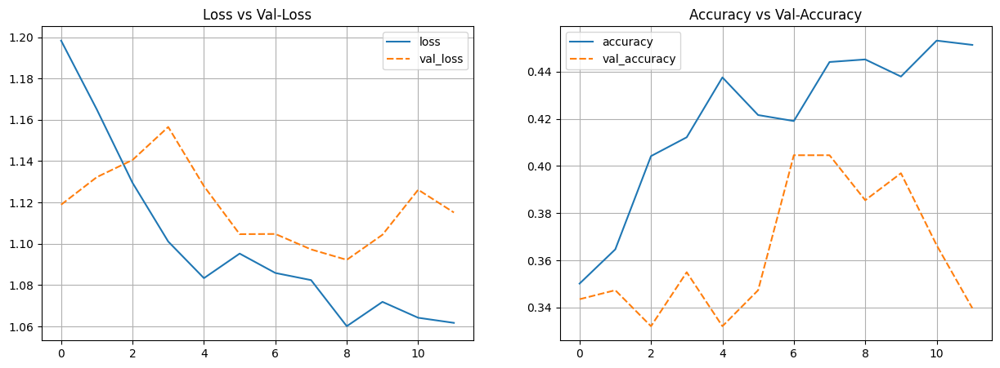

In [ ]:
# Plot training results

history2_1 = pd.DataFrame(history_2.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history2_1[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')

plt.subplot(1, 2, 2)
sns.lineplot(data=history2_1[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')
plt.show()

In [ ]:
# Check the performance of test-set

## Get the probability
y_pred_prob_2 = model_2.predict_generator(test_set)

## Get class with maximum probability
y_pred_class_2 = np.argmax(y_pred_prob_2, axis=-1)

## Display Classification Report
print(classification_report(test_set.classes, y_pred_class_2, target_names=np.array(list(train_set.class_indices.keys()))))

              precision    recall  f1-score   support

         dry       0.32      0.34      0.33        35
      normal       0.57      0.44      0.50        59
        oily       0.39      0.50      0.44        40

    accuracy                           0.43       134
   macro avg       0.43      0.43      0.42       134
weighted avg       0.45      0.43      0.44       134



Hasil perbaikan:

1. Training & validation loss lebih teratur menurun dan tidak se-fluktuatif model pertama

2. Validation accuracy meningkat sedikit (hingga 40–41 %) dan klasifikasi untuk kelas “dry”/“oily” membaik (precision/recall naik), dan rata-rata matrik ada di 40an yang berarti data nya memang mirip mirip di ketiga kelas karena memang tercampur.

3. dan waktu training lebih cepat

# viii. Model Saving

In [ ]:
model_2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 batch_normalization (Batch  (None, 222, 222, 32)      128       
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 222, 222, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 batch_normalization_1 (Bat  (None, 109, 109, 64)      2

In [ ]:
model_2.save('final_model.keras')

# ix. Model Inference

terdapat di file inference.ipynb

dari prediksi pertama model salah mengenali type oily sebagai normal, prediksi kedua sebaliknya type normal sebagai oily dan prediksi terakhir benar untuk type oily.

# x. Pengambilan Kesimpulan

Kesimpulan

Model sudah jauh lebih stabil dan general dibanding versi awal berkat batch norm, He init, dropout, dan callbacks. Namun akurasi validasi dan distribusi prediksi masih menunjukkan bahwa model belum “mengerti” fitur penting untuk membedakan antar kelas, karena dari awal datanya memang banyak yang tercampur dari kelas oily dry dan normal, dan juga banyak character lain juga selain kulit wajah dan juga pencahayaan berbeda beda.

**Jadi model masih buruk.**

Dengan membersihkan datanya dulu lalu meningkatkan augmentasi, transfer learning, dan tuning lebih dalam, performa model kemungkinan bisa meningkat secara signifikan.